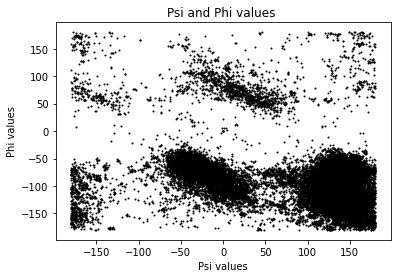

In [19]:
import matplotlib.pyplot as pyplot

import pandas as pd
import numpy as np
import statistics 

# Read the csv-file with GDP and extract the data for the chosen year
df = pd.read_csv("./datasets/data_all.csv")
phi_code = 'phi'
psi_code = 'psi'

# Get gdp and co2 from joined dataframe and set to x and y values
xValues = df[psi_code]

yValues = df[phi_code]

# Plot the arrays
pyplot.plot(xValues, yValues, 'ko', markersize=1)

# Make a linear fit to the data
#m, b = np.polyfit(xValues, yValues, 1)

# Plot the line
#pyplot.plot(xValues, m*xValues + b)
#print("slope: " +str(m))
#print("intercept: " + str(b))

# Set up labels and title for the plot
pyplot.xlabel('Psi values')
pyplot.ylabel('Phi values')
pyplot.title("Psi and Phi values ")
# Set a variable fig to point to the current figure (the scatter plot)
fig = pyplot.gcf()

# Draw and show the plot
pyplot.draw()
pyplot.show()
# Save the current figure into a png image with the name scatterplot
fig.savefig("psi_phi_scatter")




In [ ]:
import numpy as np
import seaborn as sns

phi_psi_df = df[[phi_code, psi_code]]

svm = sns.heatmap(phi_psi_df, yticklabels=False, cbar_kws={'label': 'Angles'})
svm.set_title('Combinations of Phi and Psi')
figure = svm.get_figure()    
figure.savefig('heatmap.png', dpi=400)

ELBOW:  3


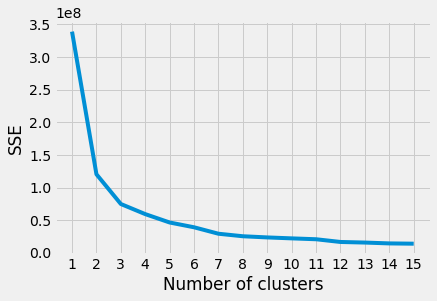

In [26]:
from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

kmeans_args = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42
}
k_tests = range(1,16)
sse = []
for k in k_tests:
    kmeans = KMeans(n_clusters=k, **kmeans_args)
    kmeans.fit(phi_psi_df)
    sse.append(kmeans.inertia_)

kl = KneeLocator(k_tests, sse, curve="convex", direction="decreasing")
print("ELBOW:", kl.elbow)

pyplot.style.use("fivethirtyeight")
pyplot.plot(k_tests, sse)
pyplot.xticks(k_tests)
pyplot.xlabel("Number of clusters")
pyplot.ylabel("SSE")
pyplot.show()



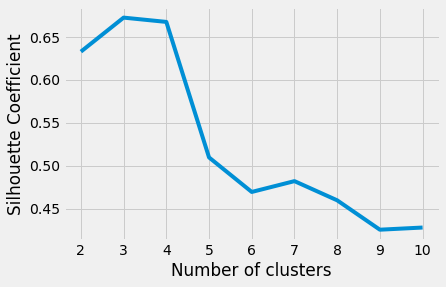

In [28]:
silhouette_coefficients = []

k_tests_range = range(2,11)


# for k in k_tests_range:
#     kmeans = KMeans(n_clusters=k, **kmeans_args)
#     kmeans.fit(phi_psi_df)
#     score = silhouette_score(phi_psi_df, kmeans.labels_)
#     silhouette_coefficients.append(score)

# pyplot.style.use("fivethirtyeight")
# pyplot.plot(k_tests_range, silhouette_coefficients)
# pyplot.xticks(k_tests_range)
# pyplot.xlabel("Number of clusters")
# pyplot.ylabel("Silhouette Coefficient")
# pyplot.show()


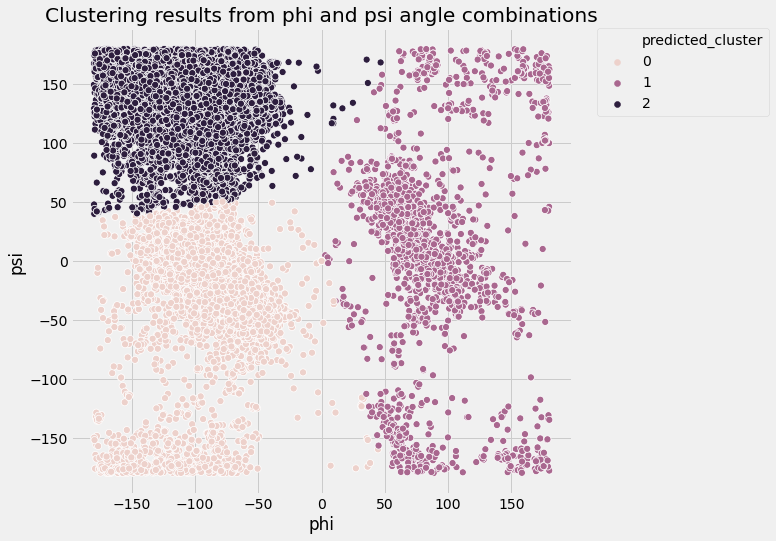

In [39]:
kmeans = KMeans(n_clusters=3, **kmeans_args)
kmeans.fit(phi_psi_df)

phi_psi_df["predicted_cluster"] = kmeans.labels_


pyplot.style.use("fivethirtyeight")
pyplot.figure(figsize=(8,8))

scat = sns.scatterplot(
    phi_code,
    psi_code,
    s=50,
    data= phi_psi_df,
    hue="predicted_cluster"
)
scat.set_title("Clustering results from phi and psi angle combinations")
pyplot.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
pyplot.show()


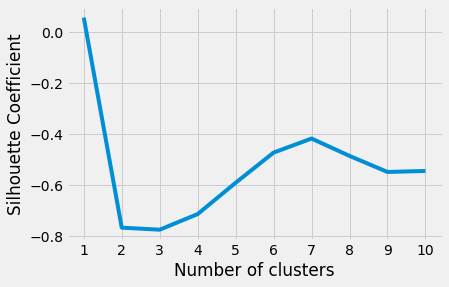

In [46]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score

k_tests_range = range(1,11)
silhouette_coefficients = []
eps = [0.1 , 0.2 , 0.3 , 0.4 , 0.5 , 0.6 , 0.7 , 0.8 , 0.9 , 1]
for k in k_tests_range:
    dbscan = DBSCAN(eps=(k/10), min_samples=5)
    dbscan.fit(phi_psi_df)
    score = silhouette_score(phi_psi_df, dbscan.labels_)
    silhouette_coefficients.append(score)

pyplot.style.use("fivethirtyeight")
pyplot.plot(k_tests_range, silhouette_coefficients)
pyplot.xticks(k_tests_range)
pyplot.xlabel("Epsilon")
pyplot.ylabel("Silhouette Coefficient")
pyplot.title("DBSCAN Silhouette Coefficients")
pyplot.show()

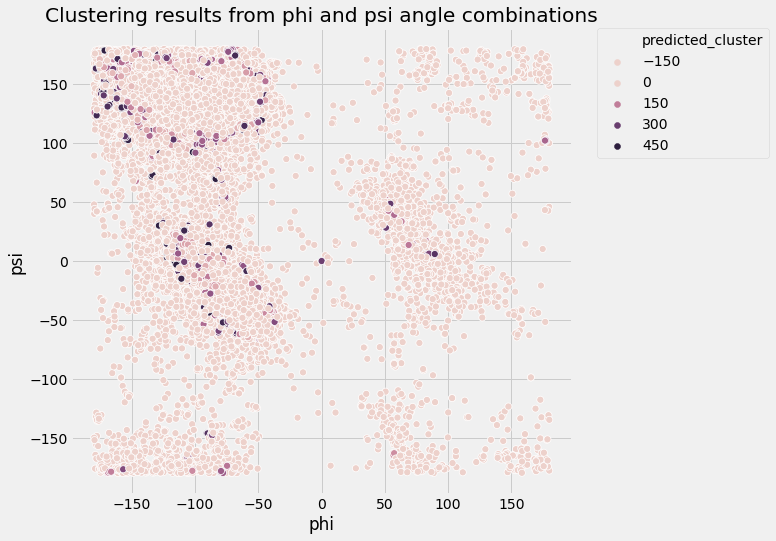

In [62]:
dscan = DBSCAN(eps=0.7, min_samples=1000)
dbscan.fit(phi_psi_df)

phi_psi_df["predicted_cluster"] = dbscan.labels_

pyplot.style.use("fivethirtyeight")
pyplot.figure(figsize=(8,8))

scat = sns.scatterplot(
    phi_code,
    psi_code,
    s=50,
    data= phi_psi_df,
    hue="predicted_cluster"
)

scat.set_title("Clustering results from phi and psi angle combinations")
pyplot.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
pyplot.show()